# Analyze a single Xenium sample using Python

**This vignette is part of [The Xenium In Situ Gene Expression Data Analysis Workshop](https://www.10xgenomics.com/analysis-guides/workshop-xenium-in-situ-analysis)**


How to use this Google Colab

- Select Python as the programming language: Click “Runtime -> Change runtime type”, then ensure “Runtime type” is set to “Python”. We recommend selecting “v5e-1 TPU” for this Google Colab tutorial. There could be TPU usage [limit](https://research.google.com/colaboratory/faq.html#usage-limits).
- Click the “Connect” button on the top-right corner. Now, you are ready to run the tutorial.
- You can run the analysis using the data we provided in the code. Alternatively, you can also load your own data.

# **1. Install and import packages**

First let's install and import the packages we need.
The spatialdata/scverse Python ecosystem offers a comprehensive and unified framework for analyzing Xenium data.
Key Python libraries like `spatialdata` (for core data structures and operations), `spatialdata-io` (for importing Xenium data) and `spatialdata-plot` (for static plotting) facilitate data handling, analysis, and visualization.

More information can be found in the `spatialdata` documentation: https://spatialdata.scverse.org/en/stable/.

In [2]:
# Install required python packages (takes ~1 min)
#'!' is used when using bash command instead of python in this Colab notebook
!uv pip install scanpy==1.11.2 spatialdata[extra]==0.4.0 scikit-misc==0.5.1 squidpy==1.6.5 harmonypy==0.0.10 geosketch==1.3 igraph==0.11.8

# import the python packages
import scanpy as sc
import spatialdata as sd
import pandas as pd
import numpy as np
import h5py
import anndata as ad
import spatialdata_io as sio
import spatialdata_plot
import matplotlib.pyplot as plt
import warnings
import os
import squidpy as sq

warnings.filterwarnings("ignore")

Using Python 3.12.12 environment at: /usr
Resolved 210 packages in 3.91s
Prepared 86 packages in 3.79s
Uninstalled 3 packages in 26ms
Installed 86 packages in 213ms
 + aiobotocore==2.25.2
 + aioitertools==0.13.0
 + anndata==0.12.6
 + app-model==0.4.0
 + appdirs==1.4.4
 + array-api-compat==1.12.0
 + asciitree==0.3.3
 + botocore==1.40.70
 + cachey==0.2.1
 + colorama==0.4.6
 - dask==2025.9.1
 + dask==2024.11.2
 + dask-expr==1.1.19
 + dask-image==2025.11.0
 + datashader==0.18.2
 + deprecated==1.3.1
 + docrep==0.3.2
 + fasteners==0.20
 + fbpca==1.0
 + flexcache==0.3
 + flexparser==0.4
 + flowio==1.4.0
 + freetype-py==2.5.1
 + geosketch==1.3
 + harmonypy==0.0.10
 + heapdict==1.0.1
 + hsluv==5.0.4
 + igraph==0.11.8
 + imagecodecs==2025.11.11
 + in-n-out==0.2.1
 + ipython-pygments-lexers==1.1.1
 + jedi==0.19.2
 + jmespath==1.0.1
 + legacy-api-wrap==1.5
 + loguru==0.7.3
 + magicgui==0.10.1
 + matplotlib-scalebar==0.9.0
 + multiscale-spatial-image==2.0.2
 + napari==0.6.6
 + napari-console==0.1.4

/usr/local/lib/python3.12/dist-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/usr/local/lib/python3.12/dist-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/local/lib/python3.12/dist-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/usr/lib/python3.12/importlib/__init__.py:90: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name

# **2. Xenium data visualization and analysis**

## 2.1 Download and convert Xenium output bundle to Zarr

In this notebook, we will work on the Xenium Prime Breast Cancer data. The code block below details how to convert Xenium output bundle into Python zarr format that can be use for further analysis.

We commented out this section (added '#' in front of each line), because it may take a while to run during a hands-on workshop. If you are using this notebook to analyze your own data, remove the '#'s and load your own Xenium output bundle.

In [ ]:
# # Download and unzip Xenium Prime Breast Cancer output bundle
# !wget https://s3-us-west-2.amazonaws.com/10x.files/samples/xenium/3.0.0/Xenium_Prime_Breast_Cancer_FFPE/Xenium_Prime_Breast_Cancer_FFPE_outs.zip
# !unzip Xenium_Prime_Breast_Cancer_FFPE_outs.zip -d Xenium_Prime_Breast_Cancer_FFPE_outs

# # Convert Xenium output bundle into a SpatialData object
# sdata = sio.xenium("Xenium_Prime_Breast_Cancer_FFPE_outs/")

# # We delete the image as it takes up a lot of memory and we do not use for this analysis guide
# del sdata['morphology_focus']

# # Save the SpatialData object as .zarr data bundle for fast data loading and processing in Python
# sdata.write("breast.zarr")

For the convenience of workshop attendees, we have already converted the Xenium Prime Breast Cancer data into a Python Zarr file.

**Important note:** The Zarr format used by spatialdata differs from the format used in the Xenium bundle.

In [ ]:
# Download and unzip the already converted data, it will take ~1 min
#'!' is used when using bash command instead of python in this Colab notebook
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/breast.zarr.zip
!unzip breast.zarr.zip
!rm breast.zarr.zip

## 2.2 Load SpatialData object

We will load the data into a SpatialData object to work on.

A SpatialData object is a container for various spatial omics data elements, such as images, labels, points, shapes, and tables. These objects are stored on disk as `.zarr` stores, which are essentially structured folders containing data and metadata.

In [ ]:
# Read zarr to SpatialData
sdata = sd.read_zarr("breast.zarr/")

# Take a look at the SpatialData object
sdata

## 2.3 Plot transcripts and cells






After loading the data, we will first take a quick look at the data by viewing transcripts and cells within the whole tissue area.

Before plotting the data, we need to connect the transcript information (now in AnnData 'table') with spatial information ('cell_boundaries' is used here).

In [ ]:
# Modify values in "region" table from "cell_circles" to "cell_boundaries"
sdata.tables["table"].obs["region"] = "cell_boundaries"

# Link the AnnData table to the spatial element "cell_boundaries".
sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")

In [ ]:
# Plot all cells by total transcripts counts. This step may take 1-2 mins.
sdata.pl.render_shapes("cell_boundaries", color = "total_counts").pl.show(title="")

In [ ]:
# Plot selected genes. This step may take a few minutes.
sdata.pl.render_points(
    "transcripts",
    color="feature_name",
    groups=["ERBB2", "IL7R"],
    palette=["orange", "blue"],
).pl.show(title="")

Additional details about functionalities of the `spatialdata` framework in the context of a Xenium dataset can be found [here](https://spatialdata.scverse.org/en/stable/tutorials/notebooks/notebooks/examples/technology_xenium.html).

## 2.4 Explore sub-region of interest

Sometimes, we are only interested in a specific region, for example, when working with tissue microarray (TMA).

In this workshop, we are particularly interested in one tumor region. In this section, we will learn how to explore the data for the specific tumor region.

### 2.4.1 Select sub-region by coordinates

Refresher: In the Xenium Explorer hands-on session, we have learned how to select a sub-region of interest (the tumor region for this workshop) and download its coordinates. The downloaded file is called `Selection_1_coordinates.csv`.

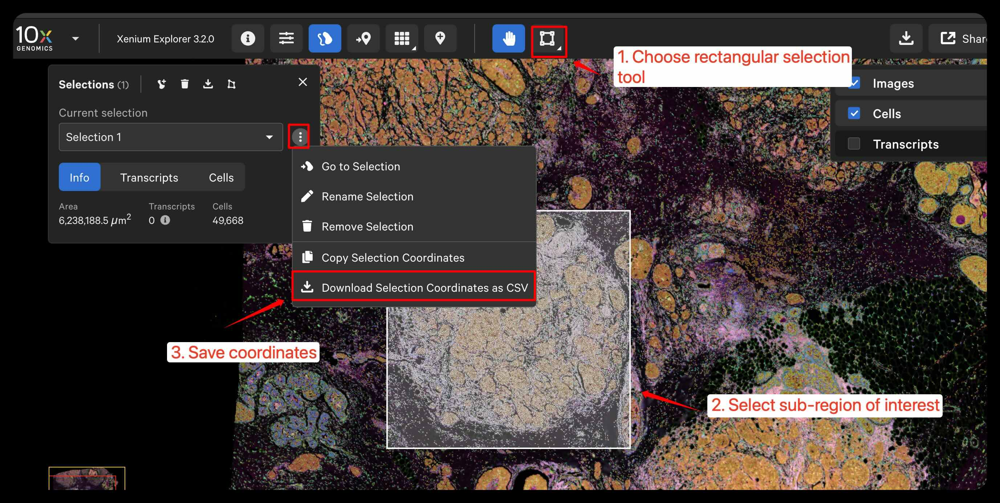

At the hands-on workshop, to save time, you can use the file link below to directly load the CSV into this notebook.

In [ ]:
# Use command line to download pre-selected Selection_1_coordinates.csv
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/Selection_1_coordinates.csv

In [ ]:
# Use the spatialdata_io library, aliased as sio
# Process these coordinates and stores as polygon
polygon = sio.xenium_explorer_selection("Selection_1_coordinates.csv")

Please note, this should be coordinates from one selection, not mulitple selections.

In [ ]:
# # Crop a subset of spatialdata based on the coordinates
# # This step takes ~5 mins, so we pre-run this and load the saved object for the next steps
# from spatialdata import polygon_query

# def crop0(x, polygon):
#     return polygon_query(
#         x,
#         polygon,
#         target_coordinate_system="global",
#     )

# cropped_sdata = crop0(sdata, polygon)
# cropped_sdata.write("cropped_sdata.zarr")
# !zip -r0 cropped_sdata.zarr.zip cropped_sdata.zarr

# Download and load the pre-generated object of sub-region
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/cropped_sdata.zarr.zip
!unzip cropped_sdata.zarr.zip

cropped_sdata = sd.read_zarr("cropped_sdata.zarr")
cropped_sdata

In [ ]:
# Link the cropped AnnData table to the spatial element "cell_boundaries"
cropped_sdata.tables["table"].obs["region"] = "cell_boundaries"
cropped_sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")

# Plot the subsetted region
cropped_sdata.pl.render_shapes("cell_boundaries", color = "total_counts").pl.show(title="")

### 2.4.2 Plot different clusters ###

In the Xenium Explorer demo during hands-on workshop, we've briefly identified the cell types for a few clusters:  
- Cluster 1 : T cells
- Cluster 2 : B cells

Here, we will plot those clusters of cells using python.

Export cell cluster information of the same tumor region we explored in the earlier section. The downloaded file is named as `Selection_1_cells_stats.csv`.

*Note: this step is necessary because the SpatialData object doesn't naturally keep the clusters information.*

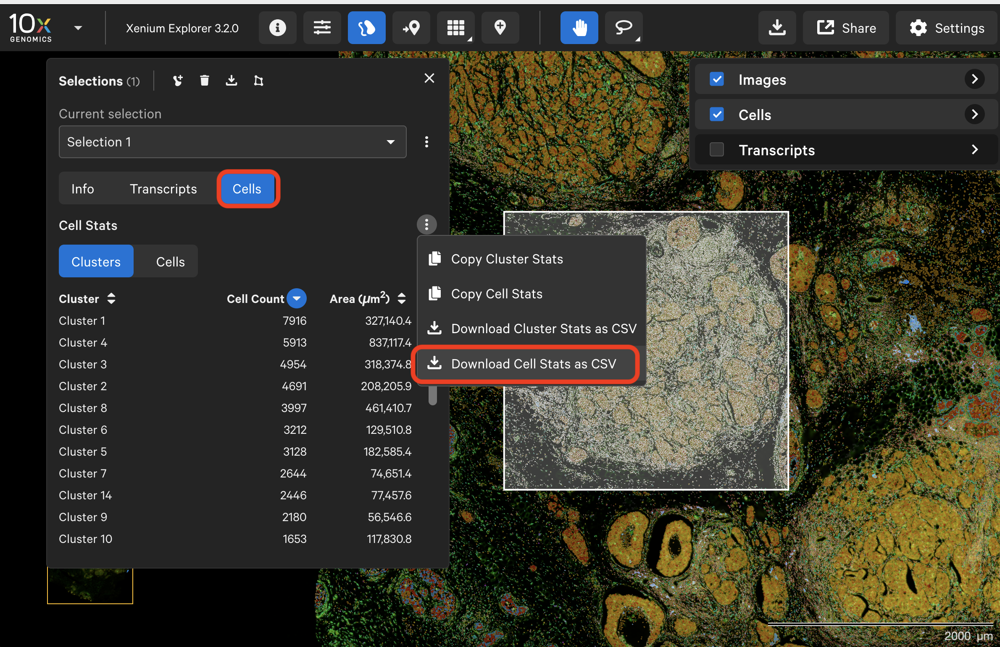

At the hands-on workshop, to save time, you can use the file link below to directly load the CSV into this notebook.

In [ ]:
# Directly download the Selection_1_cells_stats.csv
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/Selection_1_cells_stats.csv

# Read cells stats to select_cells
select_cells=pd.read_csv('Selection_1_cells_stats.csv', skiprows=2)

In [ ]:
# Select cells in cluster 1
cluster_cells = select_cells[select_cells['Cluster'] == 'Cluster 1']
cluster_sdata = sd.match_sdata_to_table(
    cropped_sdata,
    table=cropped_sdata["table"][cropped_sdata["table"].obs["cell_id"].isin(cluster_cells["Cell ID"])],
    table_name="table",
    how="right",
)

cluster_sdata.pl.render_shapes(
    "cell_boundaries", color="total_counts"
).pl.show()

# Change title of the figure
plt.title("T cells")
plt.show()

Quiz: Can you plot the cells in cluster 2?

### 2.4.3 Plot different genes ###

In [ ]:
# Plot genes
cropped_sdata.pl.render_points(
    "transcripts",
    color="feature_name",
    groups="CCND1",
    palette="red",
    size = 0.2,
    alpha = 0.75,
).pl.show()

Quiz: Can you plot 3 genes (*CCND1*, *TRBC1*, *CD19*) in different colors?

- *CCND1*: General Breast Cancer
- *TRBC1*: T Cells
- *CD19*: B Cells

## 2.5 Downstream analysis of count matrix (`sdata['table']`)

### 2.5.1 Standard data preprocessing

Similar to scRNA-seq analysis, the first step in analyzing the count matrix is quality control (QC). We want to remove cells with low transcript counts. Here, we plot the distribution of transcript counts per cell in a histogram to determine the transcript count cutoff to remove cells with low transcript counts. The determination of cutoff can be subjective. There is no gold-standard rule.  

 We shallow copy with the step `adata = sdata['table']`. Any changes made in adata will be reflected in `sdata['table']`. To make a separate adata object, run `adata = sdata['table'].copy()`.

In [ ]:
# adata = sdata['table']
# # We store the counts in the layers in case we need it for future purposes. In this analysis guide, we don't use it.
# adata.layers["counts"] = adata.X.copy()

In [ ]:
# fig = plt.hist(adata.obs['total_counts'], range=(0, 200), bins=100)
# plt.axvline(x=20, color='r', linestyle='--')  # You can customize color and linestyle

# plt.xlabel("Transcripts per cell")
# plt.ylabel("Number of cells")

In [ ]:
# # Based on the histogram plot, here we choose 20 transcript counts as lower cutoff
# thres = np.quantile(adata.obs['total_counts'], 0.98)
# sc.pp.filter_cells(adata, min_counts=20)
# sc.pp.filter_cells(adata, max_counts=thres)

# # We also filter out genes that are rarely expressed
# sc.pp.filter_genes(adata, min_cells = 100)

Next, we find top 2k variable genes in this Xenium Prime data.

The following code is for Xenium Prime data (>5k genes). Here, we used Seurat's "highly variable gene" methodology, but there are other [highly variable genes `flavor` options](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.highly_variable_genes.html)

*Note: If you are analyzing Xenium v1 data, which has fewer than 2k genes, you can use all genes in the panel.*

In [ ]:
# sc.pp.highly_variable_genes(adata, flavor = "seurat_v3", n_top_genes = 2000)

We proceed with the usual single cell workflow. We first log-normalized the data, and store the log-normalized data in a layer called "lognorm". The "lognorm" data is important for downstream analysis as a lot of the functions work with log-normalized data. Alternatively, you can store it as `adata.raw = adata.copy()`.

In [ ]:
# # Scaling of data, we don't center the data here as the data centering is done in PCA and this keeps the X sparse for memory efficiency.
# sc.pp.scale(adata, zero_center=False, max_value = 10)

In [ ]:
# # PCA for dimension reduction further by UMAP for downstream analysis
# sc.pp.pca(adata, n_comps=30)
# sc.pp.neighbors(adata, metric = 'cosine')
# # clustering with leiden. We use igraph here as it scales better. The resolution is a hyper-parameter. A higher resolution will output more clusters.
# sc.tl.leiden(adata, flavor = "igraph", n_iterations=-1, resolution = 0.5)

In [ ]:
# # Run UMAP, which may take > 20 mins.
# sc.tl.umap(adata)

### 2.5.2 Plot clustering results spatially in slide (Using preprocessed data)

During the workshop, we will load preprocessed data to skip the time-consuming steps above.


In [ ]:
# this step will take ~1 min
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/breast_processed.zarr.zip
!unzip breast_processed.zarr.zip

In [ ]:
# Read pre-processed data
sd_data = sd.read_zarr("breast_processed.zarr")
adata = sd_data['table']

In [ ]:
# Link processed AnnData table to the spatial element "cell_boundaries"
sd_data.tables["table"].obs["region"] = "cell_boundaries"
sd_data.set_table_annotates_spatialelement("table", region="cell_boundaries")

# Plot of the cell boundaries, colored according to the 'leiden' clustering results
sd_data.pl.render_shapes("cell_boundaries", color = "leiden").pl.show(figsize = (12.8, 9.6)) # specify dpi

# # Plot for a higher resolution (DPI 300; dots per inch), if a higher resolution image is needed for publication purpose
# # This may take ~1 min, , so we will skip it during in-person workshop
# sd_data.pl.render_shapes("cell_boundaries", color = "leiden").pl.show(figsize = (12.8, 9.6),dpi=300)

In [ ]:
sc.pl.umap(adata, color = 'leiden')

### 2.5.4 Export clustering results and visualize in Xenium Explorer


After data processing in python, we can also visulize the new clustering results in [Xenium Explorer](https://www.10xgenomics.com/support/software/xenium-explorer/latest). The steps below show how to export the information to load into Xenium Explorer.

In [ ]:
clustering_res = adata.obs[["cell_id", "leiden"]]
clustering_res.columns = ["cell_id","group"]
clustering_res.head()

In [ ]:
# save the new clusters to clustering_res.csv
clustering_res.to_csv("clustering_res.csv", index = False)

Follow the instructions below to upload the `clustering_res.csv` into Xenium Explorer.

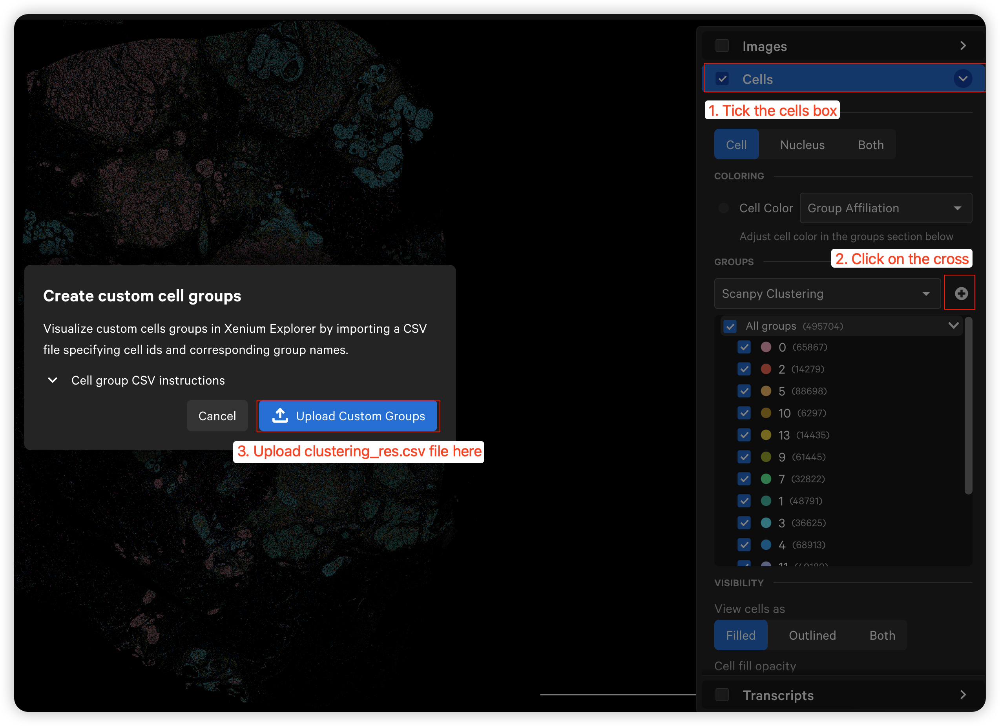

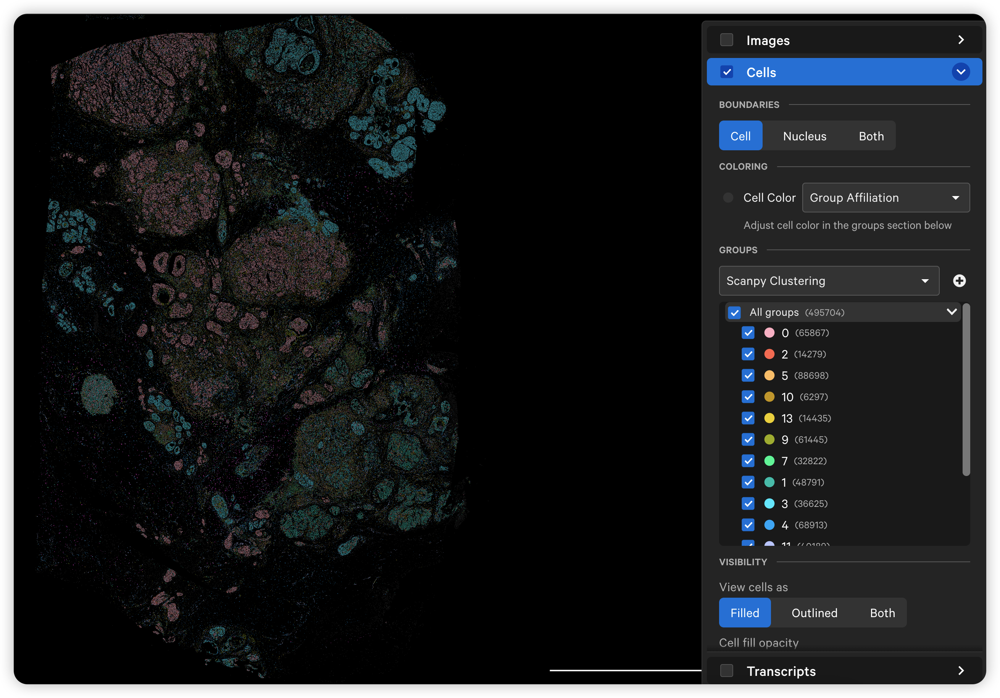

### 2.5.5 Find marker genes for each cluster for cell annotation

Use Scanpy's function `sc.tl.tl_genes_group` to identify marker genes in each cluster. By setting `pts=True`, it returns the percentage of cells that express each gene. In Scanpy, the functions are very flexible, and it is up to the user to provide the right data. For `sc.tl.rank_gene_groups`, it expects log-normalized data, therefore we set the `layer = "lognorm"` here. You can also find the detailed tutorial here: https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html

In [ ]:
# might take ~1 min to run
sc.tl.rank_genes_groups(adata, groupby = "leiden", layer = "lognorm", pts=True)

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5)

### 2.5.6 Cell annotation based on marker genes in each cluster

Based on the marker genes in each cluster, we can identify each cell type.

Here we are sharing one possible way to annotate each cluster.

- Step 1: Get marker genes in each cluster.
- Step 2: Find cell type that is highly associated with the provided marker genes via third-party tools, such as [Enrichr](https://maayanlab.cloud/Enrichr/).
- Step 3: Check spatial location of that cluster in Xenium Explorer (together with H&E image if available) and confirm its cell identity (some clusters' cell identities can be further supported by their spatial locations, such as tumor, vascular endothelial, etc.).


**Using "cluster 11" as an example below:**

In [ ]:
markers = sc.get.rank_genes_groups_df(adata, group = "11")
markers.head(10)

In [ ]:
# only print the gene names
print(markers.head(10)["names"].to_string(index=False))

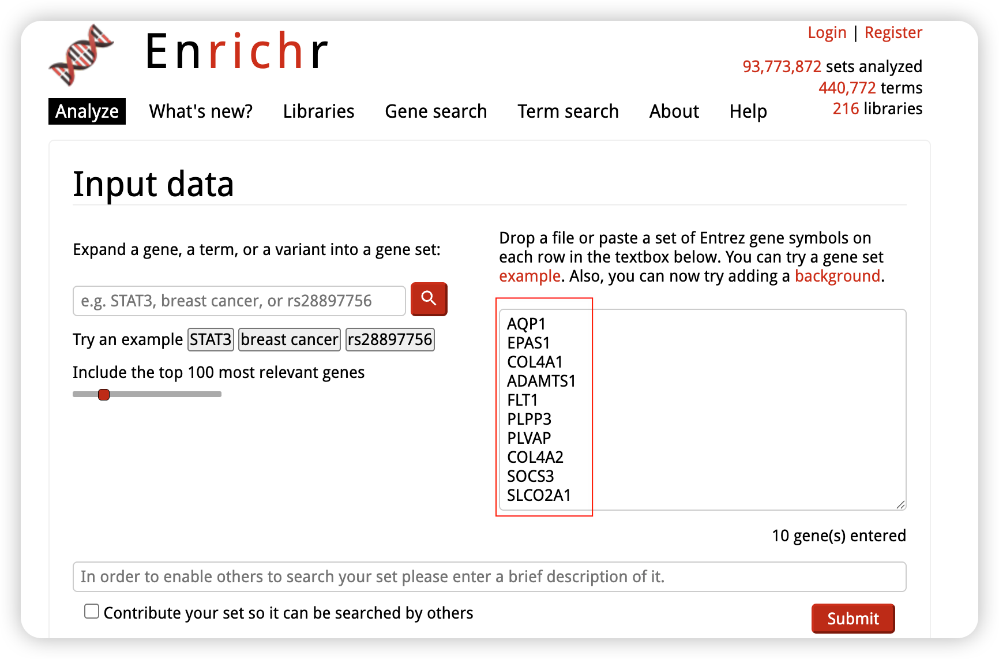

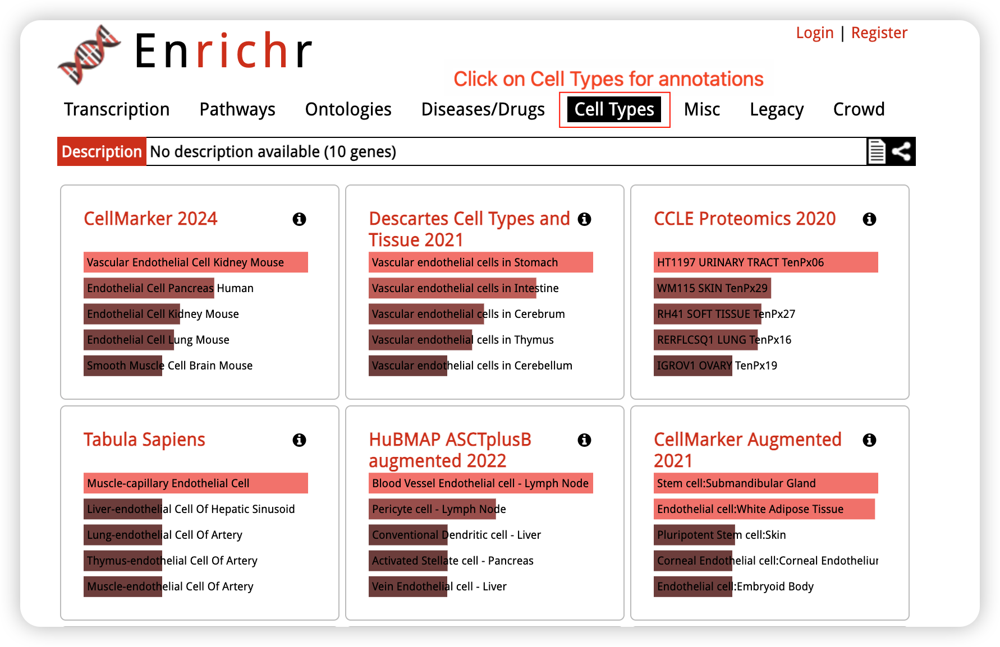

Add the manual cell type annotation to the adata object

In [ ]:
# copy the leiden cluster to manual_cell_type
adata.obs['manual_cell_type'] = adata.obs.leiden

# rename cluster 11 to "Endothelial cells"
adata.obs['manual_cell_type'] = adata.obs['manual_cell_type'].replace('11', 'Endothelial cells')


Similar steps can be applied to annotate all clusters. The process could be time-consuming when there are many clusters. If you have good reference data, automated methods could be used for annotation. An example tutorial can be found here: [Annotating Cell Types in Xenium In Situ Data with Label Transfer](https://www.10xgenomics.com/analysis-guides/xenium-cell-type-annotation)

### 2.5.7 Saving the processed data

We can save the SpatialData object as zarr file for quick loading when we resume data analysis next time.

In [ ]:
# sdata.write("breast_processed.zarr", overwrite = True)

# [Additional Topic] Spatially-aware analysis



In this section, we include a few methods you can use to further explore Xenium data using spatial-aware methods.

If you are running this section independently from the earlier sections, import the libraries and data using the code blocks below.

In [3]:
import squidpy as sq
import anndata as ad
import matplotlib.pyplot as plt

In [5]:
## Please download breast_processed data here if you want to run this session independently
!wget https://cf.10xgenomics.com/supp/xenium/analysis-workshop/breast_processed.zarr.zip
!unzip breast_processed.zarr.zip

Streaming output truncated to the last 5000 lines.
  inflating: breast_processed.zarr/tables/table/X/data/11  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._11  
  inflating: breast_processed.zarr/tables/table/X/data/7  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._7  
  inflating: breast_processed.zarr/tables/table/X/data/29  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._29  
  inflating: breast_processed.zarr/tables/table/X/data/16  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._16  
  inflating: breast_processed.zarr/tables/table/X/data/42  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._42  
  inflating: breast_processed.zarr/tables/table/X/data/89  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._89  
  inflating: breast_processed.zarr/tables/table/X/data/116  
  inflating: __MACOSX/breast_processed.zarr/tables/table/X/data/._116  
  inflating: breast_processed.za

In [6]:
# Read breast_processed zarr file that is saved from ealier section
sd_data = sd.read_zarr("breast_processed.zarr")
adata = sd_data['table']

## Neighbors enrichment analysis

Neighborhood enrichment analysis calculates an enrichment score by assessing the proximity of cell clusters on the connectivity graph. This score is then compared to a distribution generated through permutations, and a z-score is calculated based on the observed versus expected number of events.

Below, cluster 3 shows the highest self-enrichment, meaning it is most frequently found near itself.

In [7]:
#Compute spatial neighbors. This step may take a few minutes.
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=True)
# Compute neighborhood enrichment
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

  0%|          | 0/1000 [00:00<?, ?/s]

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


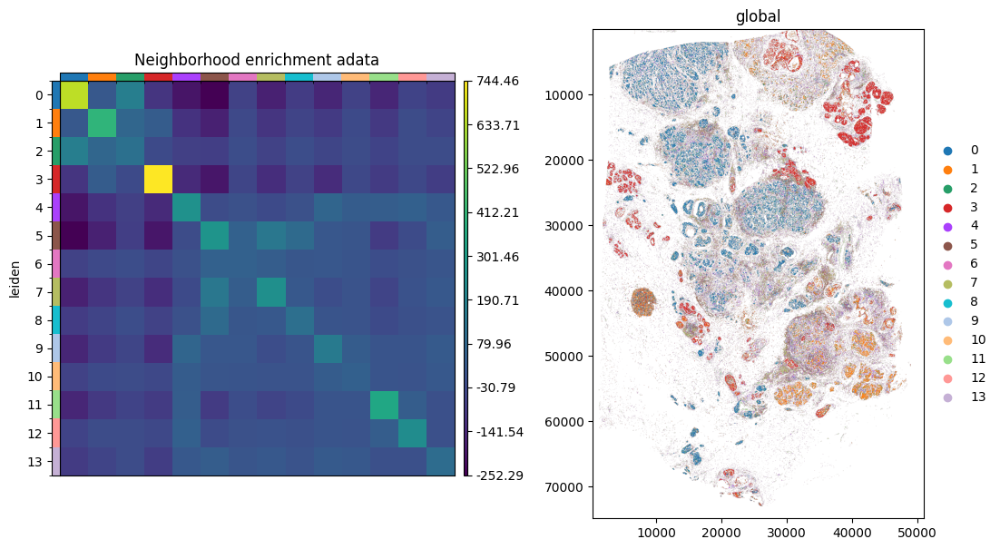

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(13, 7))
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    figsize=(8, 8),
    title="Neighborhood enrichment adata",
    ax=ax[0],
)
sd_data.pl.render_shapes("cell_boundaries", color="leiden").pl.show(ax=ax[1])

## Identify Spatially Variable Genes/Features (SVF) by Moran's I score

A gene with the highest Moran's I score in a spatial transcriptomics dataset is a prime example of a spatially variable gene that exhibits strong, non-random, and clustered expression. This makes it a valuable candidate for understanding tissue organization, identifying spatial domains, and inferring biological functions linked to specific locations within the tissue.

In [ ]:
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    n_jobs=-1,
)
adata.uns["moranI"].head(10)

While the following plotting function is running, we can go back to Xenium Explorer to examine the expression level for those genes.

In [ ]:
# We can also use squidpy's plotting to plot out the genes
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    color=["XBP1", "CA12"],
    shape=None,
    size=2,
    img=False,
    layer="lognorm",
)

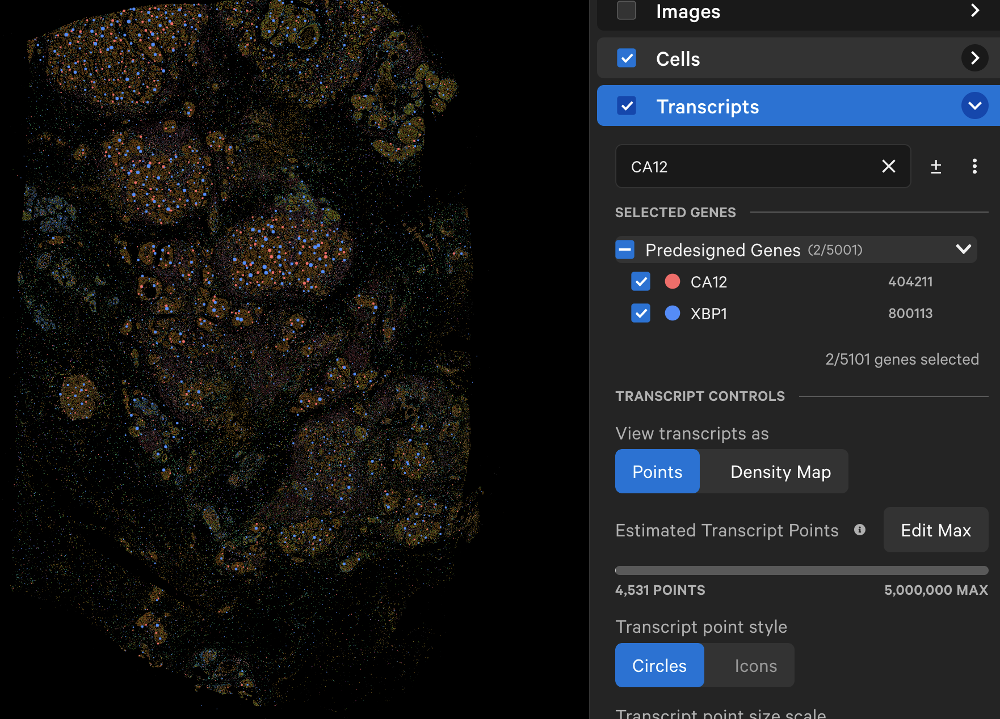

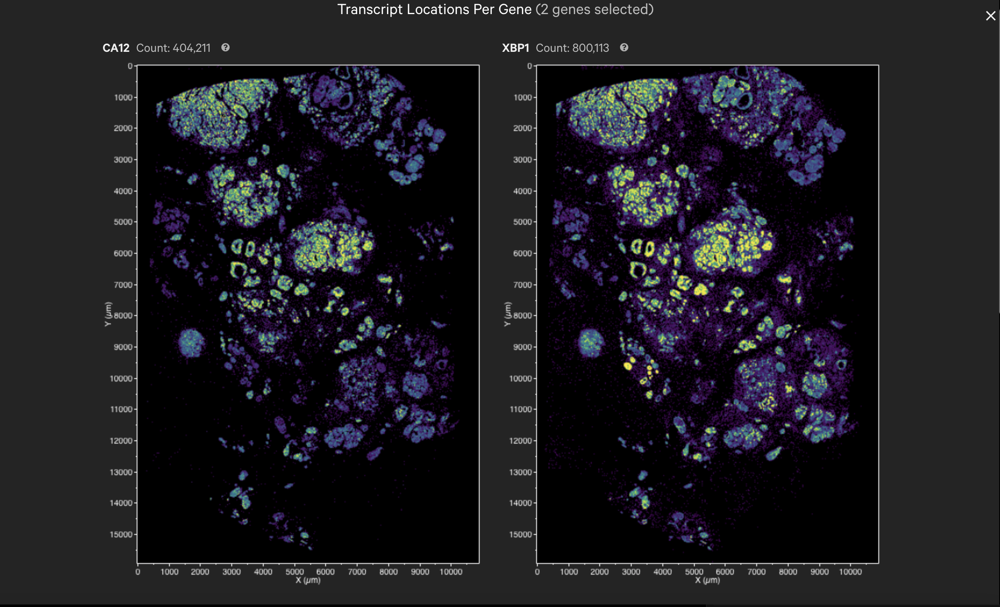

_XBP1_ is not a marker for all types of breast cancer, it is a crucial factor, particularly in certain subtypes like ER-positive and triple-negative breast cancer (TNBC). https://www.cell.com/heliyon/fulltext/S2405-8440(20)32060-0 https://pmc.ncbi.nlm.nih.gov/articles/PMC7557884/